# Student Grades Prediction Project

### Dataset Description

The dataset contains grades scored by students throughout their university tenure in various courses and their CGPA calculated based on their grades.

Columns Description-  total 43 columns

Seat No : The enrolled number of candidate that took the exams

CGPA : The cumulative GPA based on the four year total grade progress of each candidate . CGPA is a Final Marks provided to student.
 
All other columns are course codes in the format AB-XXX where AB are alphabets representing candidates' departments and XXX are numbers where first X represents the year the canditate took exam.

Predict - CGPA of a student based on different grades in four years.

### Importing Libraries

In [1]:
# Numerical computation and data manipulation 
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Z-score normalization and Box-Cox transformation
from scipy.stats import zscore, boxcox

# Suppress warnings
import warnings 
warnings.filterwarnings('ignore')

# Data preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# VIF calculation
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Linear regression models
from sklearn.linear_model import LinearRegression, Ridge, Lasso

# K-Nearest Neighbors regressor
from sklearn.neighbors import KNeighborsRegressor

# Decision Tree regression
from sklearn.tree import DecisionTreeRegressor

# Support Vector Regression
from sklearn.svm import SVR

# Ensemble algorithms
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, BaggingRegressor

# XGBoost for boosting
import xgboost as xgb

# Metrics for checking the performance of models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Data splitting and validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, GridSearchCV

# Saving and loading models
import joblib

### Elaboratory Data Analysis

In [2]:
# Load data from CSV into DataFrame
df = pd.read_csv('Student_Grades_Dataset.csv')

In [3]:
# Display first 5 rows of the dataframe
df.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [4]:
# Display last 5 rows of the dataframe
df.tail()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193
570,CS-97571,C,D,D,C,C,D+,B,C+,C,...,C+,C,B-,D,F,C-,B+,D,C-,1.753


In [5]:
# Display shape of the dataframe
df.shape

(571, 43)

In [6]:
# Display the names of the columns 
df.columns

Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

In [7]:
df.columns

Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

In [8]:
# Checking for the null values 
df.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

Null values are present in the dataset.

In [9]:
# Replacing the null values with the most common values present in the columns
most_common_values = df.mode().iloc[0]
df = df.fillna(most_common_values)

In [10]:
# Again checking for the null values
df.isnull().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-406       0
CS-414       0
CS-419       0
CS-423       0
CS-412       0
CGPA         0
dtype: int64

#### Data Preprocessing

Feature 'Seat No.' is typically considered less significant for predicting grades of the student in the context of the student grades prediction dataset. This feature is not directly related with type of glass and may not provide meaningful information for the prediction task.

In [11]:
# Dropping Seat No. feature 
df.drop(columns=['Seat No.'], inplace= True)

In [12]:
df.shape

(571, 42)

To enhance convenience for modeling purposes, it is necessary to transform categorical values into the numerical format based on their order. 
In grading system,

A+ equivalent to 4.0

A equivalent to 4.0 

A- equivalent to 3.7

B+ equivalent to 3.4

B equivalent to 3.0

B- equivalent to 2.7

C+ equivalent to 2.4

C equivalent to 2.0

C- equivalent to 1.7

D+ equivalent to 1.4

D equivalent to 1.0

F equivalent to 0.0

In [13]:
# Transforming categorical features values into numeric values
for column in df.columns:
    df[column] = df[column].replace('A+', 4.0)
    df[column] = df[column].replace('A', 4.0)
    df[column] = df[column].replace('A-', 3.7)
    df[column] = df[column].replace('B+', 3.4)
    df[column] = df[column].replace('B', 3.0)
    df[column] = df[column].replace('B-', 2.7)
    df[column] = df[column].replace('C+', 2.4)
    df[column] = df[column].replace('C', 2.0)
    df[column] = df[column].replace('C-', 1.7)
    df[column] = df[column].replace('D+', 1.4)
    df[column] = df[column].replace('D', 1.0)
    df[column] = df[column].replace('F', 0.0)
    df[column] = df[column].replace('W', 0.0)
    df[column] = df[column].replace('WU', 0.0)
    df[column] = df[column].replace('I', 0.0)

In [14]:
df.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,2.7,1.4,1.7,2.0,1.7,1.4,1.0,1.7,2.7,1.7,...,1.7,1.7,1.7,1.7,3.7,4.0,1.7,3.0,3.7,2.205
1,4.0,1.0,1.4,1.0,2.7,2.0,1.0,4.0,1.4,1.0,...,1.4,1.0,2.0,1.0,3.7,2.7,2.0,2.0,3.0,2.008
2,4.0,3.0,4.0,2.7,3.4,4.0,2.7,3.4,3.7,3.7,...,3.0,3.0,4.0,2.0,4.0,4.0,4.0,3.7,4.0,3.608
3,1.0,2.4,1.4,1.0,1.0,3.7,1.4,1.7,1.0,2.4,...,1.4,2.0,1.4,1.7,2.7,3.0,2.4,2.4,2.4,1.906
4,3.7,3.7,3.7,3.4,4.0,4.0,3.7,3.4,4.0,3.7,...,2.7,3.4,3.4,2.7,3.7,4.0,3.7,3.7,4.0,3.448


In [15]:
# Checking for the number of unique values present in the features and an in  the target variable
df.nunique()

PH-121        11
HS-101        11
CY-105        11
HS-105/12     11
MT-111        11
CS-105        10
CS-106        11
EL-102        11
EE-119        11
ME-107        11
CS-107        11
HS-205/20     11
MT-222        11
EE-222        11
MT-224        11
CS-210        11
CS-211        11
CS-203        11
CS-214        11
EE-217        11
CS-212        11
CS-215        11
MT-331        11
EF-303        11
HS-304        11
CS-301        11
CS-302        10
TC-383        11
MT-442        11
EL-332        11
CS-318        11
CS-306        11
CS-312        11
CS-317        11
CS-403        10
CS-421        11
CS-406        11
CS-414        11
CS-419        11
CS-423        11
CS-412        11
CGPA         491
dtype: int64

In [16]:
# Checking for the value count in the feautres and target variable
columns = df.columns
for i in range(len(columns)):
    print(df[columns[i]].value_counts())

4.0    133
3.7    112
3.4     61
3.0     57
2.7     56
1.0     44
2.0     33
2.4     31
1.4     22
1.7     19
0.0      3
Name: PH-121, dtype: int64
3.7    82
2.7    78
2.0    68
3.0    63
3.4    59
1.7    50
2.4    47
1.0    45
4.0    42
1.4    36
0.0     1
Name: HS-101, dtype: int64
4.0    209
3.7    120
3.4     50
3.0     49
2.7     42
1.0     31
2.0     19
2.4     17
1.7     16
1.4     14
0.0      4
Name: CY-105, dtype: int64
4.0    131
3.7     75
3.4     70
3.0     57
1.0     45
2.0     41
2.7     40
2.4     39
1.7     36
1.4     34
0.0      3
Name: HS-105/12, dtype: int64
4.0    123
3.7    107
2.7     70
3.4     62
3.0     55
1.7     39
2.4     33
2.0     30
1.0     26
1.4     21
0.0      5
Name: MT-111, dtype: int64
4.0    194
3.7    134
3.4     60
3.0     51
2.7     38
2.4     23
2.0     22
1.7     22
1.4     15
1.0     12
Name: CS-105, dtype: int64
3.7    118
3.4    101
3.0     96
4.0     60
2.7     54
2.4     41
1.4     29
1.7     27
1.0     24
2.0     18
0.0      3
Name: CS-1

In [17]:
# Display dataframe's details, such as column data types and missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     571 non-null    float64
 1   HS-101     571 non-null    float64
 2   CY-105     571 non-null    float64
 3   HS-105/12  571 non-null    float64
 4   MT-111     571 non-null    float64
 5   CS-105     571 non-null    float64
 6   CS-106     571 non-null    float64
 7   EL-102     571 non-null    float64
 8   EE-119     571 non-null    float64
 9   ME-107     571 non-null    float64
 10  CS-107     571 non-null    float64
 11  HS-205/20  571 non-null    float64
 12  MT-222     571 non-null    float64
 13  EE-222     571 non-null    float64
 14  MT-224     571 non-null    float64
 15  CS-210     571 non-null    float64
 16  CS-211     571 non-null    float64
 17  CS-203     571 non-null    float64
 18  CS-214     571 non-null    float64
 19  EE-217     571 non-null    float64
 20  CS-212    

In [18]:
# Display summary statistics of the dataframe
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,...,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000
mean,3.018389,2.628371,3.269702,2.885989,3.001051,3.329247,2.974956,2.982837,3.033100,2.711559,...,2.962347,2.707881,3.152890,2.514011,3.322942,3.440806,3.047811,2.997023,3.306130,2.954888
std,0.971594,0.908402,0.923424,1.013114,0.938643,0.799826,0.852357,0.966665,0.821065,1.018482,...,1.034341,0.869497,0.852533,0.908003,0.788436,0.767565,0.739991,0.880316,0.749513,0.620552
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000
25%,2.400000,2.000000,2.850000,2.000000,2.400000,3.000000,2.700000,2.400000,2.400000,1.700000,...,2.000000,2.000000,2.700000,2.000000,3.000000,3.200000,2.700000,2.400000,3.000000,2.538000
50%,3.400000,2.700000,3.700000,3.000000,3.400000,3.700000,3.000000,3.400000,3.400000,2.700000,...,3.400000,2.700000,3.400000,2.700000,3.700000,3.700000,3.000000,3.400000,3.700000,3.029000
75%,3.700000,3.400000,4.000000,3.700000,3.700000,4.000000,3.700000,3.700000,3.700000,3.700000,...,4.000000,3.400000,4.000000,3.000000,3.700000,4.000000,3.700000,3.700000,3.700000,3.451000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.985000


### Data Visualization 

In [19]:
sns.set(style = 'whitegrid')

#### Univariate Analysis

#### Count Plot

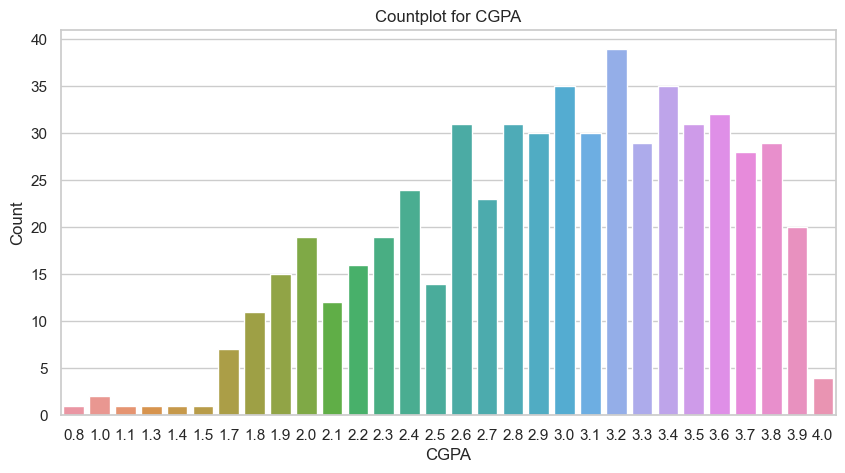

In [20]:
# Univariate analysis using countplot for target variable
plt.figure(figsize = (10, 5))
target = df['CGPA'].round(1)
sns.countplot(target)
plt.title("Countplot for CGPA")
plt.xlabel("CGPA")
plt.ylabel("Count")
plt.show()

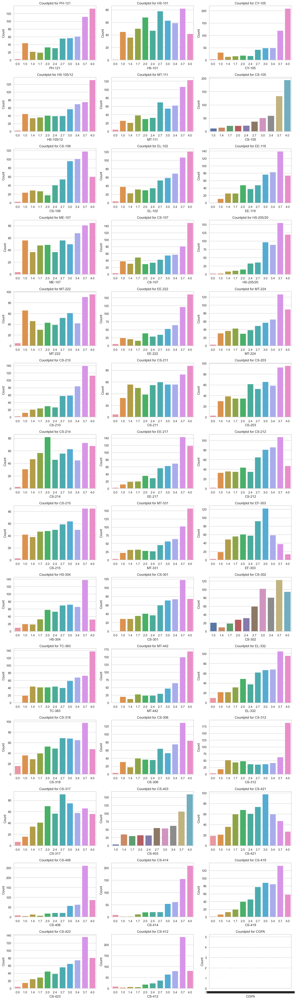

In [21]:
# Univariate analysis using countplot for numeric features
numerical_columns = df.columns
nrows = 14
ncols = 3
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (15, 50))
for i in range(len(numerical_columns)):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    sns.countplot(df[numerical_columns[i]], ax = ax)
    ax.set_title(f"Countplot for {numerical_columns[i]}")
    ax.set_xlabel(numerical_columns[i])
    ax.set_ylabel("Count")
plt.tight_layout()
plt.show()

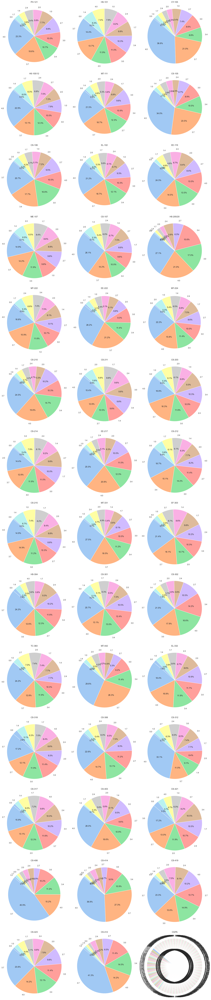

In [22]:
# Univariate analysis using pie chart for numeric features
numerical_columns = df.columns
nrows = 14
ncols = 3
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (17, 80))
for i in range(len(numerical_columns)):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    counts = df[numerical_columns[i]].value_counts()
    labels = counts.index
    data = counts.values
    ax.pie(data, labels = labels, autopct = '%1.1f%%', startangle = 140, colors = sns.color_palette('pastel'))
    ax.axis('equal')  
    ax.set_title(numerical_columns[i])
plt.tight_layout()
plt.show()

#### Histogram

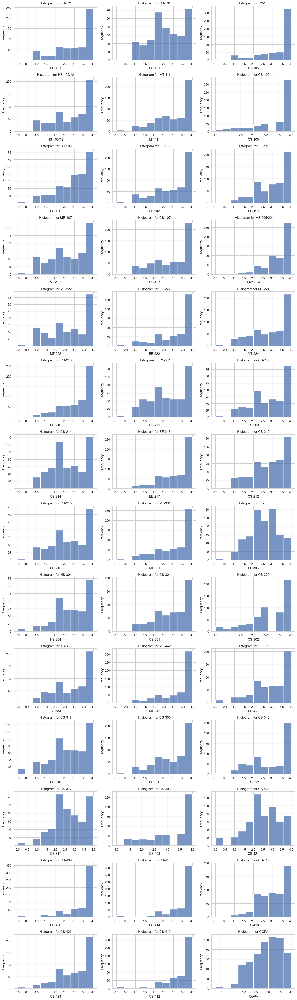

In [23]:
# Univariate analysis using histogram for numeric features
numerical_columns = df.columns
nrows = 14
ncols = 3
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (15, 50))
for i in range(len(numerical_columns)):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    sns.histplot(df[numerical_columns[i]], bins = 10, ax = ax)
    ax.set_title(f"Histogram for {numerical_columns[i]}")
    ax.set_xlabel(numerical_columns[i])
    ax.set_ylabel("Frequency")
plt.tight_layout()
plt.show()

#### Violin Plot

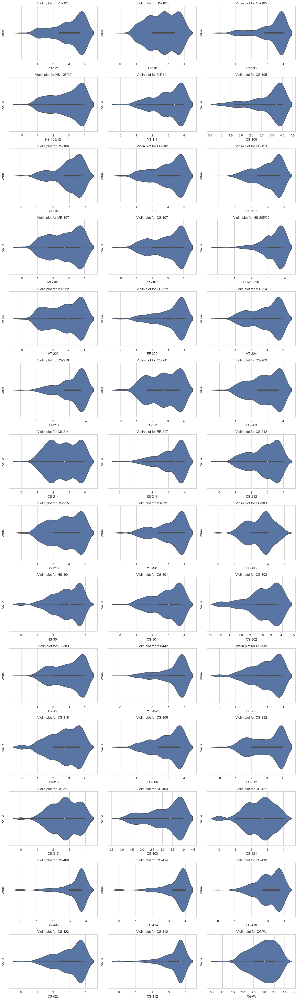

In [24]:
# Univariate analysis using violin plot for numeric features
numerical_columns = df.columns
nrows = 14
ncols = 3
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (15, 50))
for i in range(len(numerical_columns)):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    sns.violinplot(df[numerical_columns[i]], ax = ax)
    ax.set_title(f"Violin plot for {numerical_columns[i]}")
    ax.set_xlabel(numerical_columns[i])
    ax.set_ylabel("Value")
plt.tight_layout()
plt.show()

#### Bivariate Analysis

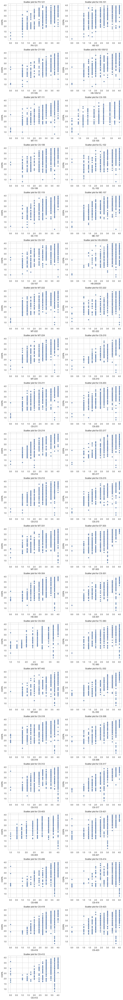

In [25]:
# Bivariate analysis using Scatter plot 
numerical_columns = df.columns
nrows = 21
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (10, 80))
for i in range(len(numerical_columns)):
    if i < len(numerical_columns) - 1:
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        sns.scatterplot(data = df, x = numerical_columns[i], y = 'CGPA', ax = ax)
        ax.set_title(f"Scatter plot for {numerical_columns[i]}")
        ax.set_xlabel(numerical_columns[i])
        ax.set_ylabel("CGPA")
    else:
        axes[-1,-1].axis('off')  
plt.tight_layout()
plt.show()

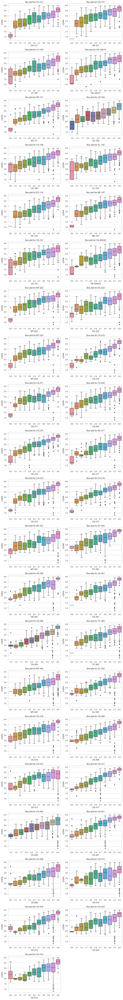

In [26]:
# Bivariate analysis using Box plot
numerical_columns = df.columns
nrows = 21
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (10, 80))
for i in range(len(numerical_columns)):
    if i < len(numerical_columns) - 1:
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        sns.boxplot(data = df, x = numerical_columns[i], y = 'CGPA', ax = ax)
        ax.set_title(f"Box plot for {numerical_columns[i]}")
        ax.set_xlabel(numerical_columns[i])
        ax.set_ylabel("CGPA")
    else:
        axes[-1, -1].axis('off')
plt.tight_layout()
plt.show()

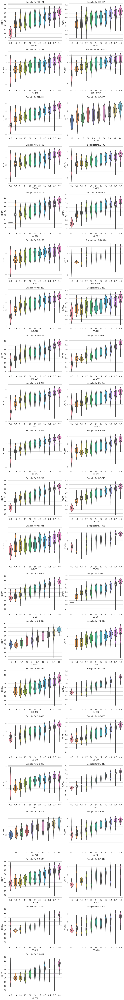

In [27]:
# Bivariate analysis using Violin plot
numerical_columns = df.columns
nrows = 21
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (10, 80))
for i in range(len(numerical_columns)):
    if i < len(numerical_columns) - 1:
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        sns.violinplot(data = df, x = numerical_columns[i], y = 'CGPA', ax = ax)
        ax.set_title(f"Box plot for {numerical_columns[i]}")
        ax.set_xlabel(numerical_columns[i])
        ax.set_ylabel("CGPA")
    else:
        axes[-1, -1].axis('off')
plt.tight_layout()
plt.show()

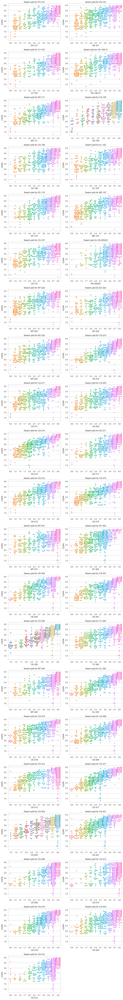

In [28]:
# Bivariate analysis using Swarm plot 
numerical_columns = df.columns
nrows = 21
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (10, 80))
for i in range(len(numerical_columns)):
    if i < len(numerical_columns) - 1:
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]
        sns.swarmplot(data = df, x = numerical_columns[i], y = 'CGPA', ax = ax)
        ax.set_title(f"Swarm plot for {numerical_columns[i]}")
        ax.set_xlabel(numerical_columns[i])
        ax.set_ylabel("CGPA")
    else:
        axes[-1, -1].axis('off')
plt.tight_layout()
plt.show()

#### Checking for the outliers

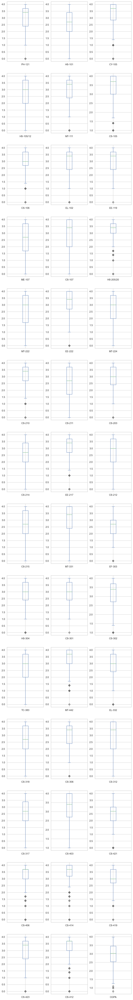

In [29]:
# Cheking for the outliers

# Using boxplot
df.plot(kind = 'box', subplots = True, figsize = (10, 80), layout = (14,3))
plt.show()

In [30]:
# Using Z-Score
z_score = abs(zscore(df))
z_score

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,0.327985,1.353419,1.701362,0.875288,1.387312,2.414197,2.319085,1.328238,0.406048,0.994074,...,1.221506,1.160170,1.705699,0.897270,0.478655,0.729169,1.822984,0.003385,0.525963,1.209480
1,1.011196,1.794139,2.026525,1.863209,0.321011,1.663377,2.319085,1.053162,1.990745,1.681974,...,1.511801,1.965939,1.353497,1.668868,0.478655,0.965983,1.417219,1.133567,0.408796,1.527217
2,1.011196,0.409460,0.791552,0.183743,0.425400,0.839359,0.322866,0.431927,0.812950,0.971356,...,0.036435,0.336258,0.994511,0.566585,0.859489,0.729169,1.287885,0.799251,0.926574,1.053392
3,2.079221,0.251619,2.026525,1.863209,2.133723,0.463948,1.849387,1.328238,2.478344,0.306173,...,1.511801,0.814840,2.057900,0.897270,0.790792,0.574794,0.876198,0.678786,1.210018,1.691731
4,0.702154,1.180720,0.466389,0.507802,1.065181,0.839359,0.851380,0.431927,1.178649,0.971356,...,0.253859,0.796697,0.290109,0.205013,0.478655,0.729169,0.882120,0.799251,0.926574,0.795331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,0.018943,1.511260,0.791552,0.804178,1.065181,0.839359,0.851380,0.742544,1.178649,0.676541,...,0.713788,1.142027,0.994511,1.637981,0.859489,0.053209,0.476354,0.003385,0.926574,1.359839
567,1.011196,1.511260,0.791552,1.100555,1.065181,0.839359,1.203654,0.742544,1.178649,1.266170,...,0.423494,0.796697,0.994511,1.637981,0.478655,0.574794,0.882120,1.133567,0.525963,1.317904
568,0.018943,1.511260,0.466389,0.507802,1.065181,0.839359,1.203654,1.053162,1.178649,0.283456,...,0.713788,0.336258,0.994511,0.976611,0.859489,1.878757,0.476354,0.799251,0.525963,0.830814
569,1.011196,0.850180,2.460075,1.100555,2.133723,2.414197,0.322866,1.328238,0.406048,0.994074,...,1.898859,0.336258,0.179493,0.897270,2.948851,1.878757,0.064667,0.337701,1.744166,1.228834


Outliers are present in the dataset.

In [31]:
# Removing Outliers
z = 3
df1 = df[(z_score < z).all(axis = 1)]
df1.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,2.7,1.4,1.7,2.0,1.7,1.4,1.0,1.7,2.7,1.7,...,1.7,1.7,1.7,1.7,3.7,4.0,1.7,3.0,3.7,2.205
1,4.0,1.0,1.4,1.0,2.7,2.0,1.0,4.0,1.4,1.0,...,1.4,1.0,2.0,1.0,3.7,2.7,2.0,2.0,3.0,2.008
2,4.0,3.0,4.0,2.7,3.4,4.0,2.7,3.4,3.7,3.7,...,3.0,3.0,4.0,2.0,4.0,4.0,4.0,3.7,4.0,3.608
3,1.0,2.4,1.4,1.0,1.0,3.7,1.4,1.7,1.0,2.4,...,1.4,2.0,1.4,1.7,2.7,3.0,2.4,2.4,2.4,1.906
4,3.7,3.7,3.7,3.4,4.0,4.0,3.7,3.4,4.0,3.7,...,2.7,3.4,3.4,2.7,3.7,4.0,3.7,3.7,4.0,3.448


In [32]:
df1.shape

(526, 42)

#### Checking for the Skewness

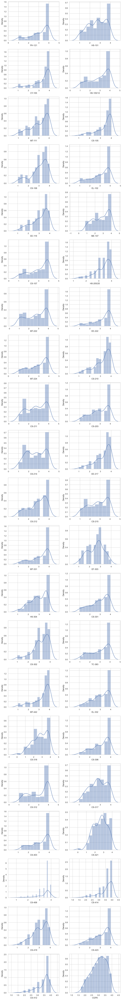

In [33]:
# Checking for the skewness

# Using distplot

# Bivariate analysis using Swarm plot 
numerical_columns = df1.columns
nrows = 21
ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (10, 80))
for i in range(len(numerical_columns)):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    sns.distplot(df1[numerical_columns[i]], ax = ax)
plt.tight_layout()
plt.show()

In [34]:
df1.skew()

PH-121      -0.945945
HS-101      -0.250907
CY-105      -1.402992
HS-105/12   -0.618940
MT-111      -0.782081
CS-105      -1.364628
CS-106      -0.932084
EL-102      -0.819869
EE-119      -0.811852
ME-107      -0.401603
CS-107      -0.730805
HS-205/20   -1.152701
MT-222      -0.403013
EE-222      -1.097271
MT-224      -0.699180
CS-210      -1.042516
CS-211      -0.275431
CS-203      -0.500370
CS-214      -0.121936
EE-217      -1.038967
CS-212      -0.623190
CS-215      -0.339798
MT-331      -0.880707
EF-303      -0.221027
HS-304      -0.537608
CS-301      -0.689931
CS-302      -1.014194
TC-383      -0.559985
MT-442      -1.302485
EL-332      -0.647389
CS-318      -0.555089
CS-306      -0.733155
CS-312      -0.506208
CS-317      -0.227455
CS-403      -0.742724
CS-421      -0.284277
CS-406      -1.748896
CS-414      -1.490058
CS-419      -0.692165
CS-423      -0.746511
CS-412      -1.327577
CGPA        -0.371132
dtype: float64

These values indicate that the distributions for these features tend to have longer tails on the left side. Negative skewness present in the dataset.

In [35]:
# Dropping target variable 'CGPA' from dataset
df2 = df1.drop(columns = 'CGPA')

In [36]:
# Skewness reduction
high_skewed_columns = df2.columns
transformed_df1 = df2.copy()
transformed_df2 = df2.copy()
transformed_df3 = df2.copy()
transformed_df4 = df2.copy()
transformed_df5 = df2.copy()
transformed_df6 = df2.copy()
transformed_df7 = df2.copy()

# Apply different transformations

# Log Transformation
transformed_df1[high_skewed_columns] = np.log1p(df2[high_skewed_columns])

# Square Root Transformation
transformed_df2[high_skewed_columns] = np.sqrt(df2[high_skewed_columns])

# Box-Cox Transformation
for column in high_skewed_columns:
    transformed_df3[column], lambda_value = boxcox(df2[column] + 1)  # Adding 1 to handle zero and negative values

# Reciprocal Transformation
transformed_df4[high_skewed_columns] = 1 / (df2[high_skewed_columns] + 1)  # Adding 1 to handle zero values

# Exponential Transformation
transformed_df5[high_skewed_columns] = np.exp(df2[high_skewed_columns])

# Power Transformation
transformed_df6[high_skewed_columns] = df2[high_skewed_columns] ** 2
transformed_df7[high_skewed_columns] = df2[high_skewed_columns] ** 3

In [37]:
transformed_df1.skew()

PH-121      -1.334964
HS-101      -0.639672
CY-105      -1.816424
HS-105/12   -0.951447
MT-111      -1.176777
CS-105      -1.752571
CS-106      -1.343967
EL-102      -1.193563
EE-119      -1.179177
ME-107      -0.811936
CS-107      -1.072312
HS-205/20   -1.584482
MT-222      -0.712625
EE-222      -1.483063
MT-224      -1.027119
CS-210      -1.460597
CS-211      -0.608213
CS-203      -0.873095
CS-214      -0.465293
EE-217      -1.463530
CS-212      -0.986342
CS-215      -0.696593
MT-331      -1.221284
EF-303      -0.623366
HS-304      -0.945855
CS-301      -1.073077
CS-302      -1.596577
TC-383      -0.865915
MT-442      -1.701740
EL-332      -1.055851
CS-318      -1.423513
CS-306      -1.114885
CS-312      -0.748396
CS-317      -0.625573
CS-403      -1.028551
CS-421      -1.206188
CS-406      -2.269187
CS-414      -1.833978
CS-419      -1.134152
CS-423      -1.133624
CS-412      -1.732077
dtype: float64

In [38]:
transformed_df2.skew()

PH-121      -1.223662
HS-101      -0.530781
CY-105      -1.694665
HS-105/12   -0.856294
MT-111      -1.059403
CS-105      -1.629275
CS-106      -1.226554
EL-102      -1.086136
EE-119      -1.066344
ME-107      -0.793866
CS-107      -0.973333
HS-205/20   -1.440550
MT-222      -0.628215
EE-222      -1.369266
MT-224      -0.932905
CS-210      -1.331167
CS-211      -0.513567
CS-203      -0.763282
CS-214      -0.366143
EE-217      -1.330321
CS-212      -0.884321
CS-215      -0.595574
MT-331      -1.119676
EF-303      -0.512891
HS-304      -0.823255
CS-301      -0.962560
CS-302      -1.418906
TC-383      -0.775313
MT-442      -1.581761
EL-332      -0.932260
CS-318      -1.660288
CS-306      -0.999837
CS-312      -0.674842
CS-317      -0.507317
CS-403      -0.939747
CS-421      -1.457834
CS-406      -2.100450
CS-414      -1.714966
CS-419      -0.994964
CS-423      -1.016267
CS-412      -1.594346
dtype: float64

In [39]:
transformed_df3.skew()

PH-121      -0.383938
HS-101      -0.133449
CY-105      -0.576661
HS-105/12   -0.298920
MT-111      -0.310231
CS-105      -0.517352
CS-106      -0.284174
EL-102      -0.340519
EE-119      -0.277508
ME-107      -0.214880
CS-107      -0.342836
HS-205/20   -0.279576
MT-222      -0.234029
EE-222      -0.452964
MT-224      -0.318776
CS-210      -0.342201
CS-211      -0.166954
CS-203      -0.212966
CS-214      -0.112601
EE-217      -0.346811
CS-212      -0.243108
CS-215      -0.181243
MT-331      -0.379669
EF-303      -0.088108
HS-304      -0.187181
CS-301      -0.264713
CS-302      -0.230058
TC-383      -0.276139
MT-442      -0.514307
EL-332      -0.233178
CS-318      -0.188434
CS-306      -0.277212
CS-312      -0.307515
CS-317      -0.104511
CS-403      -0.333746
CS-421      -0.076453
CS-406      -0.392454
CS-414      -0.435191
CS-419      -0.184031
CS-423      -0.274458
CS-412      -0.296933
dtype: float64

In [40]:
transformed_df4.skew()

PH-121       1.763734
HS-101       1.086754
CY-105       2.297275
HS-105/12    1.334203
MT-111       1.662598
CS-105       2.269930
CS-106       1.794257
EL-102       1.619957
EE-119       1.639483
ME-107       1.665078
CS-107       1.475034
HS-205/20    2.121944
MT-222       1.034568
EE-222       1.946244
MT-224       1.409554
CS-210       1.998718
CS-211       0.987957
CS-203       1.318186
CS-214       0.883222
EE-217       2.026207
CS-212       1.390579
CS-215       1.105118
MT-331       1.634552
EF-303       1.063417
HS-304       1.480636
CS-301       1.518152
CS-302       2.323769
TC-383       1.236937
MT-442       2.203573
EL-332       1.575405
CS-318       3.406934
CS-306       1.603111
CS-312       1.059336
CS-317       1.105088
CS-403       1.367062
CS-421       3.542752
CS-406       2.970768
CS-414       2.269101
CS-419       1.725002
CS-423       1.629697
CS-412       2.269187
dtype: float64

In [41]:
transformed_df5.skew()

PH-121      -0.012932
HS-101       0.769221
CY-105      -0.473756
HS-105/12    0.214599
MT-111       0.110372
CS-105      -0.478542
CS-106       0.230902
EL-102       0.098020
EE-119       0.142698
ME-107       0.481036
CS-107       0.078565
HS-205/20   -0.123807
MT-222       0.439613
EE-222      -0.201388
MT-224       0.164035
CS-210      -0.058068
CS-211       0.592053
CS-203       0.396903
CS-214       0.737770
EE-217      -0.088629
CS-212       0.416876
CS-215       0.557461
MT-331      -0.044035
EF-303       1.159892
HS-304       0.404012
CS-301       0.296187
CS-302       0.192549
TC-383       0.223986
MT-442      -0.375274
EL-332       0.294938
CS-318       0.623193
CS-306       0.184527
CS-312       0.051749
CS-317       0.810439
CS-403       0.002993
CS-421       1.097104
CS-406      -0.541056
CS-414      -0.604512
CS-419       0.335883
CS-423       0.178973
CS-412      -0.317036
dtype: float64

In [42]:
transformed_df6.skew()

PH-121      -0.516249
HS-101       0.190952
CY-105      -0.969883
HS-105/12   -0.248970
MT-111      -0.374192
CS-105      -0.977138
CS-106      -0.442179
EL-102      -0.408004
EE-119      -0.415408
ME-107      -0.008017
CS-107      -0.363093
HS-205/20   -0.713202
MT-222      -0.028812
EE-222      -0.693228
MT-224      -0.330010
CS-210      -0.613801
CS-211       0.105322
CS-203      -0.097981
CS-214       0.253115
EE-217      -0.618407
CS-212      -0.190845
CS-215       0.060336
MT-331      -0.512932
EF-303       0.303596
HS-304      -0.121656
CS-301      -0.262311
CS-302      -0.443115
TC-383      -0.222956
MT-442      -0.892876
EL-332      -0.227778
CS-318       0.036233
CS-306      -0.335998
CS-312      -0.255099
CS-317       0.215845
CS-403      -0.426125
CS-421       0.351334
CS-406      -1.237603
CS-414      -1.134640
CS-419      -0.247781
CS-423      -0.345924
CS-412      -0.922790
dtype: float64

Boxcox transformation reduced the skewness to the maximum extent therefore, the columns in transformed_df3 exhibit reduced skewness.

In [43]:
df3 = transformed_df3
df3.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-306,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,15.614079,1.665275,16.993891,4.576834,4.899452,14.313824,2.241272,4.935200,15.707427,2.450925,...,6.452960,3.260728,2.091197,5.593952,2.132022,1725.572549,6362.451278,4.742967,14.965837,757.785628
1,38.345536,1.142677,10.095089,1.620864,11.816990,42.766486,2.241272,27.132022,4.140504,1.274270,...,1.972798,2.455030,1.147678,7.674908,1.162445,1725.572549,867.817225,6.366839,6.720180,318.596698
2,38.345536,4.034314,250.244336,7.497571,18.952606,514.965969,15.159338,19.179467,32.142162,6.873945,...,21.866448,7.918751,4.074047,34.040811,2.579703,2496.873370,6362.451278,25.248027,23.262167,1056.576512
3,2.271845,3.099057,10.095089,1.620864,1.999192,381.108601,4.051825,4.935200,2.278060,3.830515,...,4.799589,2.455030,2.524159,3.899438,2.132022,413.474265,1453.639589,8.976993,9.548329,132.987825
4,31.907765,5.187075,191.202574,11.151738,26.777098,514.965969,30.770410,19.179467,38.641005,6.873945,...,21.866448,6.674279,4.735357,23.544052,3.690525,1725.572549,6362.451278,21.422954,23.262167,1056.576512


In [44]:
# Adding target variable 'CGPA' in back in dataset
df3['CGPA'] = df['CGPA']
df3.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,15.614079,1.665275,16.993891,4.576834,4.899452,14.313824,2.241272,4.935200,15.707427,2.450925,...,3.260728,2.091197,5.593952,2.132022,1725.572549,6362.451278,4.742967,14.965837,757.785628,2.205
1,38.345536,1.142677,10.095089,1.620864,11.816990,42.766486,2.241272,27.132022,4.140504,1.274270,...,2.455030,1.147678,7.674908,1.162445,1725.572549,867.817225,6.366839,6.720180,318.596698,2.008
2,38.345536,4.034314,250.244336,7.497571,18.952606,514.965969,15.159338,19.179467,32.142162,6.873945,...,7.918751,4.074047,34.040811,2.579703,2496.873370,6362.451278,25.248027,23.262167,1056.576512,3.608
3,2.271845,3.099057,10.095089,1.620864,1.999192,381.108601,4.051825,4.935200,2.278060,3.830515,...,2.455030,2.524159,3.899438,2.132022,413.474265,1453.639589,8.976993,9.548329,132.987825,1.906
4,31.907765,5.187075,191.202574,11.151738,26.777098,514.965969,30.770410,19.179467,38.641005,6.873945,...,6.674279,4.735357,23.544052,3.690525,1725.572549,6362.451278,21.422954,23.262167,1056.576512,3.448


In [45]:
# Checking the correalation coefficient matrix
correlation_coefficient = df3.corr()
correlation_coefficient

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.356126,0.556844,0.510333,0.416705,0.626749,0.293400,0.357832,0.611434,0.545748,...,-0.019024,0.492533,0.369321,0.325479,0.311600,0.092347,0.511254,0.083437,0.318902,0.625071
HS-101,0.356126,1.000000,0.328280,0.493824,0.439541,0.402708,0.374270,0.345083,0.287383,0.344987,...,0.212332,0.401827,0.272164,0.334168,0.339572,0.228734,0.312602,0.247027,0.244944,0.537979
CY-105,0.556844,0.328280,1.000000,0.575779,0.542656,0.591509,0.385141,0.422044,0.551462,0.465892,...,0.298407,0.544195,0.592220,0.470357,0.143111,-0.031428,0.579459,0.175461,0.103673,0.676977
HS-105/12,0.510333,0.493824,0.575779,1.000000,0.496769,0.530531,0.523276,0.340245,0.401001,0.317999,...,0.304663,0.534612,0.546951,0.482730,0.177675,0.093138,0.531569,0.233250,0.170693,0.641418
MT-111,0.416705,0.439541,0.542656,0.496769,1.000000,0.365181,0.538596,0.562015,0.423249,0.465579,...,0.511010,0.604974,0.501508,0.578081,0.347045,0.228143,0.573671,0.473510,0.300562,0.754931
CS-105,0.626749,0.402708,0.591509,0.530531,0.365181,1.000000,0.295942,0.286727,0.552573,0.458170,...,-0.001555,0.395087,0.350660,0.260802,0.252410,0.060635,0.403929,0.008392,0.207707,0.580531
CS-106,0.293400,0.374270,0.385141,0.523276,0.538596,0.295942,1.000000,0.334215,0.305368,0.336470,...,0.518822,0.459452,0.521855,0.488115,0.170541,0.110399,0.508647,0.369825,0.209640,0.592667
EL-102,0.357832,0.345083,0.422044,0.340245,0.562015,0.286727,0.334215,1.000000,0.419010,0.443705,...,0.364989,0.492464,0.365248,0.410485,0.320003,0.330915,0.394604,0.442846,0.330635,0.655864
EE-119,0.611434,0.287383,0.551462,0.401001,0.423249,0.552573,0.305368,0.419010,1.000000,0.590089,...,0.152240,0.466254,0.426803,0.400848,0.274419,0.127244,0.502900,0.204064,0.336744,0.647275
ME-107,0.545748,0.344987,0.465892,0.317999,0.465579,0.458170,0.336470,0.443705,0.590089,1.000000,...,0.212298,0.476792,0.378961,0.413505,0.355118,0.142176,0.489684,0.225285,0.313771,0.673454


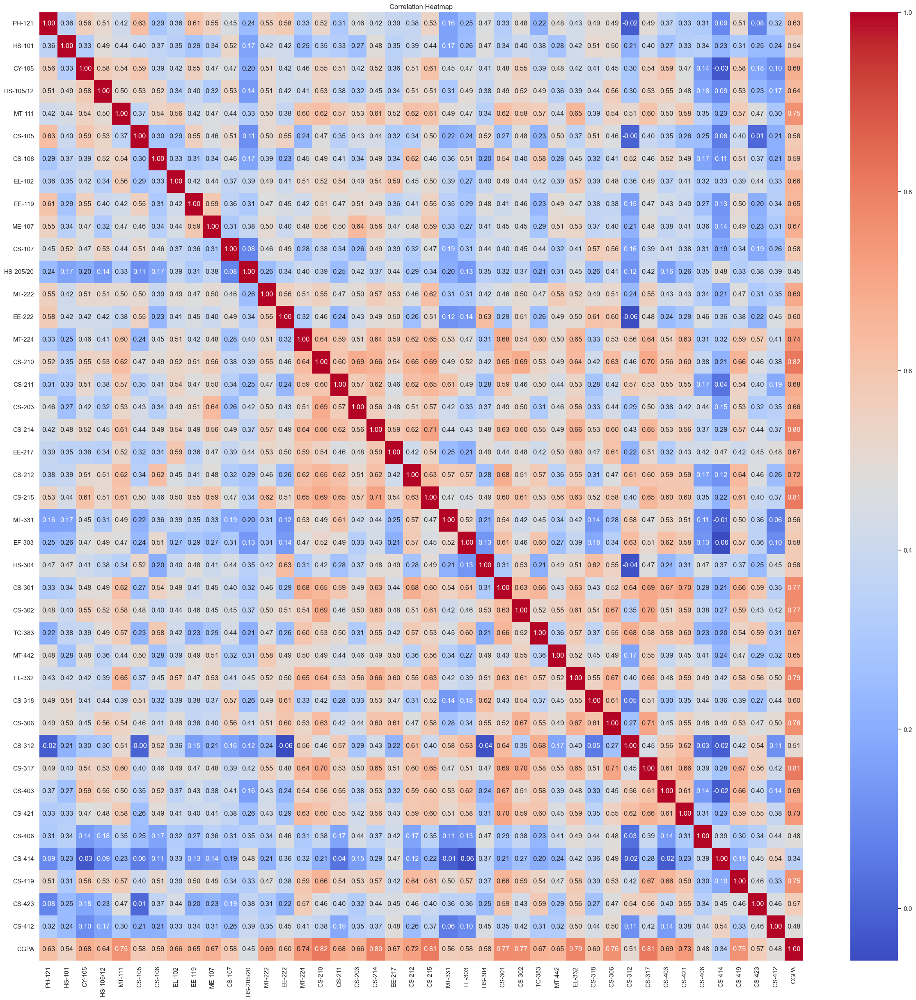

In [46]:
# Plotting the heatmap for correlation coefficient matrix
plt.figure(figsize = (30, 30))
sns.heatmap(correlation_coefficient, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title("Correlation Heatmap")
plt.show()

Features and target variables are showing both negative and positive correlation.

In [47]:
# Extracting features and target from dataset
features = df3.drop(columns = ['CGPA'])
target = df3['CGPA']

#### Feature Scaling

In [48]:
# Performing standard scaling on the features
scaler = StandardScaler()
scaled_df3 = scaler.fit_transform(features)

In [49]:
df4 = pd.DataFrame(scaled_df3, columns = features.columns[:])
df4.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-306,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,-0.703730,-1.422997,-1.736949,-1.074474,-1.489649,-1.863226,-1.886677,-1.438758,-0.713029,-1.116164,...,-1.289141,-1.306062,-1.325045,-1.539240,-1.115198,0.365402,1.061228,-1.709003,-0.256581,0.466904
1,1.165875,-1.808471,-1.817518,-1.724805,-0.634308,-1.698635,-1.886677,1.211426,-1.781433,-1.668026,...,-1.897886,-1.505997,-2.063043,-1.342678,-1.855553,0.365402,-1.593181,-1.452717,-1.313704,-1.042700
2,1.165875,0.324435,0.987112,-0.431893,0.247997,1.032917,-0.627331,0.261933,0.805002,0.958272,...,0.805177,-0.150165,0.225893,1.147782,-0.773355,1.459890,1.061228,1.527176,0.807038,1.493923
3,-1.801094,-0.365421,-1.817518,-1.724805,-1.848260,0.258587,-1.710171,-1.438758,-1.953462,-0.469124,...,-1.513794,-1.505997,-0.986392,-1.699299,-1.115198,-1.496487,-1.310175,-1.040774,-0.951125,-1.680684
4,0.636384,1.174726,0.297581,0.372046,1.215481,1.032917,0.894549,0.261933,1.405282,0.958272,...,0.805177,-0.458983,0.743155,0.156283,0.074852,0.365402,1.061228,0.923490,0.807038,1.493923


#### Checking the Variance Inflation Factor

In [50]:
# Calculate VIF for each column
vif_data = pd.DataFrame()
vif_data["Features"] = df4.columns
vif_data["VIF"] = [variance_inflation_factor(df4.values, i) for i in range(df4.shape[1])]

# Print the VIF data
print(vif_data)

     Features       VIF
0      PH-121  3.094799
1      HS-101  2.056322
2      CY-105  3.026851
3   HS-105/12  2.750016
4      MT-111  2.823957
5      CS-105  2.862157
6      CS-106  2.279944
7      EL-102  2.260654
8      EE-119  2.465692
9      ME-107  2.517885
10     CS-107  2.580674
11  HS-205/20  1.834975
12     MT-222  2.519762
13     EE-222  2.726977
14     MT-224  3.417538
15     CS-210  3.882295
16     CS-211  3.134562
17     CS-203  3.005405
18     CS-214  3.263146
19     EE-217  2.698074
20     CS-212  3.315879
21     CS-215  3.566526
22     MT-331  2.309524
23     EF-303  2.608631
24     HS-304  2.795685
25     CS-301  3.967680
26     CS-302  3.050414
27     TC-383  3.535789
28     MT-442  2.321773
29     EL-332  3.419892
30     CS-318  2.699353
31     CS-306  4.232067
32     CS-312  4.758181
33     CS-317  3.949428
34     CS-403  3.093946
35     CS-421  3.080223
36     CS-406  1.949053
37     CS-414  2.593152
38     CS-419  3.120517
39     CS-423  2.761072
40     CS-412  2

Not much multicollinearty exist between the features.

In [51]:
# Storing features and target in X and y
X = df4
y = target

#### Finding the best random state

In [52]:
# Finding the best random state
max_r2_score = 0
max_random_state = 0
for i in range(1, 200):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = i)
    lr = LinearRegression()
    lr.fit(X_train, y_train)
    pred = lr.predict(X_test)
    r2score = r2_score(y_test, pred)
    if r2score > max_r2_score:
        max_r2_score = r2score
        max_random_state = i
print("Best R2 score is", max_r2_score, "at random state", max_random_state)

Best R2 score is 0.9887916247622118 at random state 30


#### Splitting the dataset into training and testing sets

In [53]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = max_random_state)

#### Different Models for predicting Student Grades

In [54]:
# Using different regression models for prdicting Happiness Score

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_lr)
msqe = mean_squared_error(y_test, y_pred_lr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_lr))
r2score = r2_score(y_test, y_pred_lr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.04718254881583395
mean_squared_error: 0.0036915825577121114
root_mean_absolute_error: 0.060758394956681595
r2_score: 0.9887916247622118


In [55]:
# Lasso Regression
lasso_model = Lasso(alpha = 0.01)
lasso_model.fit(X_train, y_train)
y_pred_lasso = lasso_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_lasso)
msqe = mean_squared_error(y_test, y_pred_lasso)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_lasso))
r2score = r2_score(y_test, y_pred_lasso)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.049109532717952695
mean_squared_error: 0.004368578865519033
root_mean_absolute_error: 0.06609522573922441
r2_score: 0.986736129988935


In [56]:
# Ridge Regression
ridge_model = Ridge(alpha = 0.01)
ridge_model.fit(X_train, y_train)
y_pred_ridge = ridge_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_ridge)
msqe = mean_squared_error(y_test, y_pred_ridge)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
r2score = r2_score(y_test, y_pred_ridge)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.04718087775069694
mean_squared_error: 0.003691355930036069
root_mean_absolute_error: 0.060756529937415524
r2_score: 0.9887923128486876


In [57]:
# K-Nearest Neighbors Regressor
knn_model = KNeighborsRegressor(n_neighbors = 3)
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_knn)
msqe = mean_squared_error(y_test, y_pred_knn)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_knn))
r2score = r2_score(y_test, y_pred_knn)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.06628902953586502
mean_squared_error: 0.007586667369901552
root_mean_absolute_error: 0.08710147742662895
r2_score: 0.9769653764051695


In [58]:
# Support Vector Regressor
svr_model = SVR(C = 1.0, kernel = 'rbf', gamma = 'scale')
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_svr)
msqe = mean_squared_error(y_test, y_pred_svr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_svr))
r2score = r2_score(y_test, y_pred_svr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.06457384613041207
mean_squared_error: 0.0067324025439929715
root_mean_absolute_error: 0.082051219028074
r2_score: 0.9795590934822058


In [59]:
# Decision Tree Regressor
dtr_model = DecisionTreeRegressor(criterion = 'mse', random_state = 42)
dtr_model.fit(X_train, y_train)
y_pred_dtr = dtr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_dtr)
msqe = mean_squared_error(y_test, y_pred_dtr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_dtr))
r2score = r2_score(y_test, y_pred_dtr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.1557784810126582
mean_squared_error: 0.04332251265822784
root_mean_absolute_error: 0.20814060790299388
r2_score: 0.8684642777112412


In [60]:
# Random Forest Regressor 
rfr_model = RandomForestRegressor(criterion = 'mse', n_estimators = 100, max_depth = 10, random_state = 42)
rfr_model.fit(X_train, y_train)
y_pred_rfr = rfr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_rfr)
msqe = mean_squared_error(y_test, y_pred_rfr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rfr))
r2score = r2_score(y_test, y_pred_rfr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.08469110920578081
mean_squared_error: 0.01124528248514824
root_mean_absolute_error: 0.10604377626786138
r2_score: 0.9658570968472167


In [61]:
# Extra Trees Regressor
etc_model = ExtraTreesRegressor(criterion = 'mse', n_estimators = 100, max_depth = 10, random_state = 42)
etc_model.fit(X_train, y_train)
y_pred_etc = etc_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_etc)
msqe = mean_squared_error(y_test, y_pred_etc)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_etc))
r2score = r2_score(y_test, y_pred_etc)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.08100500686407675
mean_squared_error: 0.010832816479777624
root_mean_absolute_error: 0.1040808170595217
r2_score: 0.967109425269716


In [62]:
# Gradient Boosting Regressor
gbr_model = GradientBoostingRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 3, random_state = 42)
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_gbr)
msqe = mean_squared_error(y_test, y_pred_gbr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_gbr))
r2score = r2_score(y_test, y_pred_gbr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.08065116275145608
mean_squared_error: 0.010649192765851126
root_mean_absolute_error: 0.10319492606640661
r2_score: 0.9676669432057418


In [63]:
# AdaBoost Regressor
abr_model = AdaBoostRegressor(n_estimators = 100, learning_rate = 1.0, random_state = 42)
abr_model.fit(X_train, y_train)
y_pred_abr = abr_model.predict(X_test)
mse = mean_absolute_error(y_test, y_pred_abr)
msqe = mean_squared_error(y_test, y_pred_abr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_abr))
r2score = r2_score(y_test, y_pred_abr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.13514294181431777
mean_squared_error: 0.024823689121527347
root_mean_absolute_error: 0.15755535256387626
r2_score: 0.9246303670280867


In [64]:
# XGBoost Regressor
xgbr_model = xgb.XGBRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 3, random_state = 42)
xgbr_model.fit(X_train, y_train)
y_pred_xgbr = xgbr_model.predict(X_test)

mse = mean_absolute_error(y_test, y_pred_xgbr)
msqe = mean_squared_error(y_test, y_pred_xgbr)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgbr))
r2score = r2_score(y_test, y_pred_xgbr)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.0763596659551693
mean_squared_error: 0.009655467699718086
root_mean_absolute_error: 0.09826223943976692
r2_score: 0.9706840891723534


In [65]:
# Bagging Regressor
br_model = BaggingRegressor(n_estimators = 100, max_samples = 1.0, max_features = 1.0, random_state = 42)
br_model.fit(X_train, y_train)
y_pred_br = br_model.predict(X_test)
mse = mean_absolute_error(y_test, y_pred_br)
msqe = mean_squared_error(y_test, y_pred_br)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_br))
r2score = r2_score(y_test, y_pred_br)

print("mean_absolute_error:", mse)
print("mean_squared_error:", msqe)
print("root_mean_absolute_error:", rmse)
print("r2_score:", r2score)

mean_absolute_error: 0.0846023417721518
mean_squared_error: 0.011046671144936694
root_mean_absolute_error: 0.10510314526662222
r2_score: 0.9664601201828104


#### Cross Validatation

In [66]:
# Applying Cross Validation Methods on each model

# For Linear Regression
cv_score = cross_val_score(lr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_lr) - cv_score.mean())

[0.88373952 0.98603974 0.98277989 0.97737873 0.9686279 ]
0.9597131555136755
Difference between R2 score and cross validation score: 0.0290784692485363


In [67]:
# For Lasso Regression
cv_score = cross_val_score(lasso_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_lasso) - cv_score.mean())

[0.88587126 0.98271246 0.97963547 0.97470515 0.9744693 ]
0.9594787293398512
Difference between R2 score and cross validation score: 0.027257400649083774


In [68]:
# For Ridge Regression
cv_score = cross_val_score(ridge_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_ridge) - cv_score.mean())

[0.88374005 0.98604053 0.98278061 0.97738007 0.9686302 ]
0.9597142904054076
Difference between R2 score and cross validation score: 0.02907802244328006


In [69]:
# For K-Nearest Neighbors 
cv_score = cross_val_score(knn_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_knn) - cv_score.mean())

[0.84799    0.96744406 0.96484765 0.95622495 0.92655243]
0.9326118160444439
Difference between R2 score and cross validation score: 0.044353560360725575


In [70]:
# For Support Vector Regressor
cv_score = cross_val_score(svr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_svr) - cv_score.mean())

[0.89242585 0.97896986 0.97196792 0.97067108 0.9528425 ]
0.9533754414836965
Difference between R2 score and cross validation score: 0.02618365199850936


In [71]:
# For Decision Tree Regressor
cv_score = cross_val_score(dtr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_dtr) - cv_score.mean())

[0.8056781  0.80271161 0.75180403 0.58550354 0.73458029]
0.7360555111836815
Difference between R2 score and cross validation score: 0.13240876652755973


In [72]:
# For Random Forest Regressor
cv_score = cross_val_score(rfr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_rfr) - cv_score.mean())

[0.88090486 0.95353867 0.95035084 0.94084703 0.92649704]
0.9304276865212735
Difference between R2 score and cross validation score: 0.035429410325943156


In [73]:
# For Extra Trees Regressor
cv_score = cross_val_score(etc_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_etc) - cv_score.mean())

[0.87541196 0.95712562 0.95926004 0.96216879 0.93423884]
0.9376410495179875
Difference between R2 score and cross validation score: 0.02946837575172845


In [74]:
# For Gradient Boosting Regressor
cv_score = cross_val_score(gbr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_gbr) - cv_score.mean())

[0.88092383 0.96893525 0.95836612 0.94625156 0.95828338]
0.9425520269368622
Difference between R2 score and cross validation score: 0.025114916268879517


In [75]:
# For AdaBoost Regressor
cv_score = cross_val_score(abr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_abr) - cv_score.mean())

[0.84768961 0.92556029 0.91922497 0.90320905 0.84510657]
0.8881580962490233
Difference between R2 score and cross validation score: 0.03647227077906334


In [76]:
# For XGBoost Regressor
cv_score = cross_val_score(xgbr_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_xgbr) - cv_score.mean())

[0.87198198 0.97195299 0.95659619 0.94830545 0.95223152]
0.9402136252013925
Difference between R2 score and cross validation score: 0.03047046397096087


In [77]:
# For Bagging Regressor
cv_score = cross_val_score(br_model, X, y)
print(cv_score)
print(cv_score.mean())
print("Difference between R2 score and cross validation score:", r2_score(y_test, y_pred_br) - cv_score.mean())

[0.87971532 0.95653048 0.94968232 0.94343515 0.92508791]
0.9308902344559244
Difference between R2 score and cross validation score: 0.03556988572688591


Gradient Boosting Regressor model has given least difference between R2 score and cross validation score that is 0.025114916268879517

Gradient Boosting Regressor model is the best model.

#### Hyper Parameter Tuning

In [78]:
# Hyper parameter tuning
param_grid = {
    'n_estimators': [100, 200],        # Number of boosting stages
    'learning_rate': [0.01, 0.1],      # Step size at each iteration
    'max_depth': [3, 4],               # Maximum depth of trees
    'min_samples_split': [2, 3,],      # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2],        # Minimum samples required to be at a leaf node
    'subsample': [0.8, 0.9],           # Fraction of samples used for fitting trees
    'loss': ['ls', 'lad']              # Loss function
}

In [79]:
# Using grid search CV for enhancing the model performance
grid_search_cv = GridSearchCV(GradientBoostingRegressor(), param_grid, cv = 5, scoring = 'r2')

In [80]:
grid_search_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.01, 0.1], 'loss': ['ls', 'lad'],
                         'max_depth': [3, 4], 'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 3],
                         'n_estimators': [100, 200], 'subsample': [0.8, 0.9]},
             scoring='r2')

In [81]:
grid_search_cv.best_params_

{'learning_rate': 0.1,
 'loss': 'lad',
 'max_depth': 3,
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 200,
 'subsample': 0.8}

In [82]:
grid_search_cv.best_score_

0.9467083641247761

In [83]:
# Creating final model
final_model = GradientBoostingRegressor(learning_rate = 0.1, loss = 'lad', max_depth = 3, min_samples_leaf = 1, min_samples_split = 3, n_estimators = 200, subsample = 0.8)
final_model.fit(X_train, y_train)
pred_values = final_model.predict(X_test)
r2score = r2_score(y_test, pred_values)
print(r2score * 100)

97.37982825979607


In [84]:
# Saving the model 
joblib.dump(final_model, "Student_Grades_Prediction.pkl")

['Student_Grades_Prediction.pkl']

In [85]:
# Loading the saved model
model = joblib.load("Student_Grades_Prediction.pkl")

# Predicting values
predicted_values = model.predict(X_test)

In [86]:
# Compairing actual and predicted values
actual_values = np.array(y_test)
df = pd.DataFrame()
df['Actual Values'] = actual_values
df['Predicted Values'] = predicted_values
df

,Actual Values,Predicted Values
0,2.379,2.415761
1,3.573,3.647928
2,3.335,3.235013
3,3.769,3.745268
4,3.809,3.780043
...,...,...
153,2.378,2.408489
154,3.970,3.961481
155,3.432,3.354372
156,3.156,3.129567


In [87]:
# Testing the model
column_names = df4.columns
data_values = [4.0, 3.4, 3.0, 2.7, 2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 
               2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 2.4, 3.7, 4.0, 3.4, 3.0, 2.7, 2.4, 3.7]
student_data = {}
count = 0

for column in column_names:
    student_data[column] = [data_values[count]]
    count += 1

# Create a DataFrame using the dictionary
student_details = pd.DataFrame(student_data)

# Print the resulting DataFrame
print(student_details)

   PH-121  HS-101  CY-105  HS-105/12  MT-111  CS-105  CS-106  EL-102  EE-119  \
0     4.0     3.4     3.0        2.7     2.4     3.7     4.0     3.4     3.0   

   ME-107  ...  CS-306  CS-312  CS-317  CS-403  CS-421  CS-406  CS-414  \
0     2.7  ...     3.4     3.0     2.7     2.4     3.7     4.0     3.4   

   CS-419  CS-423  CS-412  
0     3.0     2.7     2.4  

[1 rows x 41 columns]


In [88]:
# Predicting student's grade
prediction = final_model.predict(student_details)
print("Student grade is", prediction)

Student grade is [3.97227115]
